# Imports

In [33]:
import cv2 as cv
import matplotlib.pyplot as plt
import os
import numpy as np
from scipy.signal import find_peaks

# Load Images data

In [34]:
pwd = os.getcwd()
location = os.path.join(pwd, 'images')
ls = [x for x in os.listdir(location) if x.endswith('.tiff')]
im_list = [os.path.join(location, x) for x in ls[:]]

# Thresholding

First, we wanted to start with the basics by applying thresholding, which helps with the detection and segmentation of cell processes. Using thresholding, the grayscale image is converted to a binary image where pixels are either 0 (black) or 255 (white). All pixels below the threshold value are classified as background, while those above the threshold are classified as foreground. We evaluated several types of thresholding techniques: simple thresholding (a fixed threshold value is chosen, and pixels are classified based on this fixed value), adaptive thresholding (the threshold value is determined for smaller regions of the image, allowing for varying lighting conditions), and otsu's thresholding (an automatic thresholding technique that finds the optimal threshold value by minimizing the intra-class variance). 

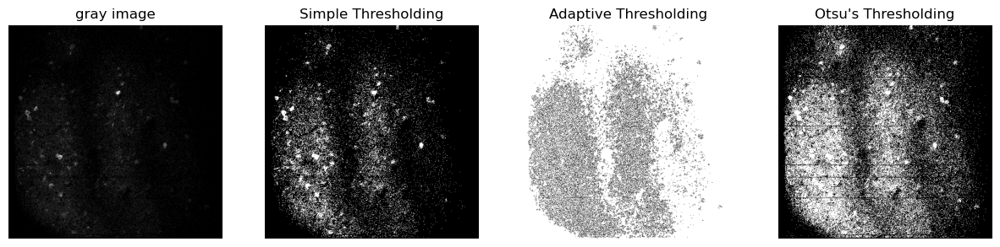

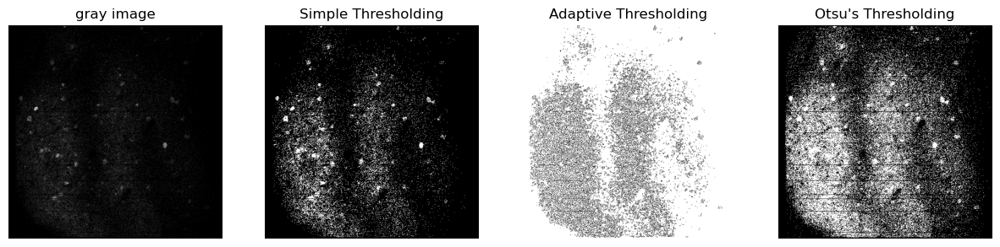

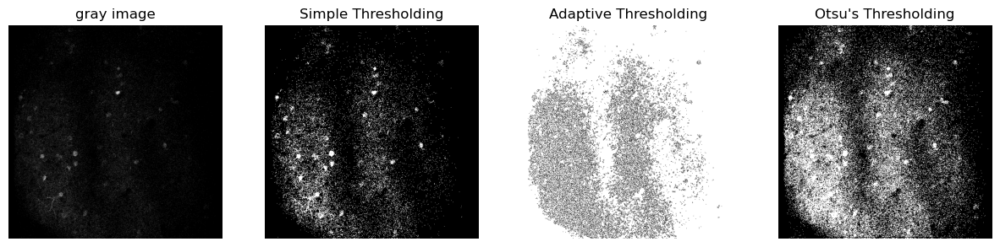

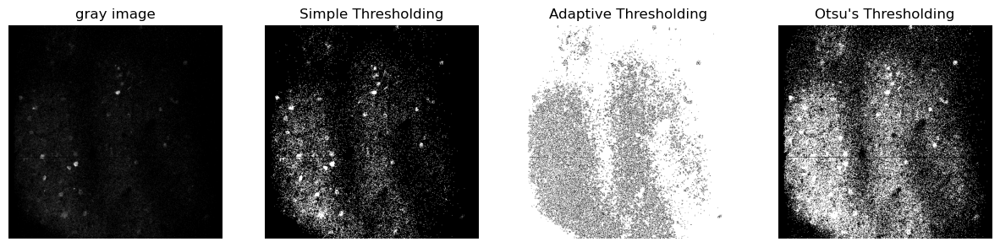

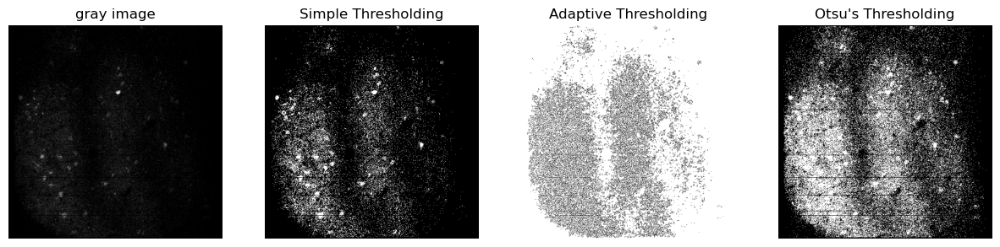

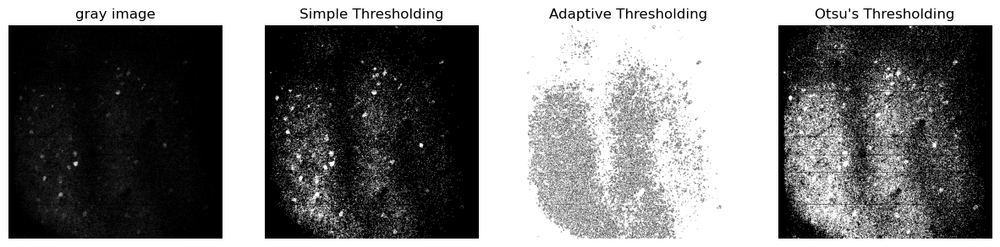

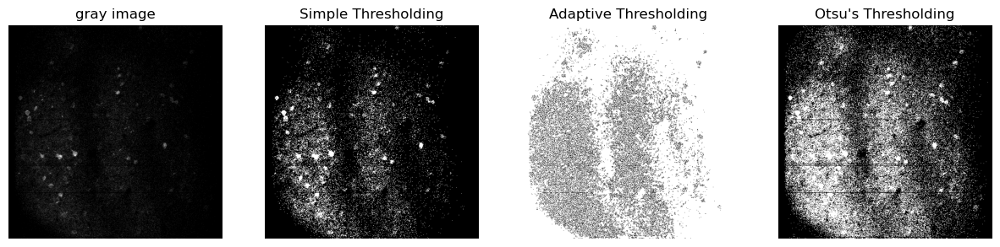

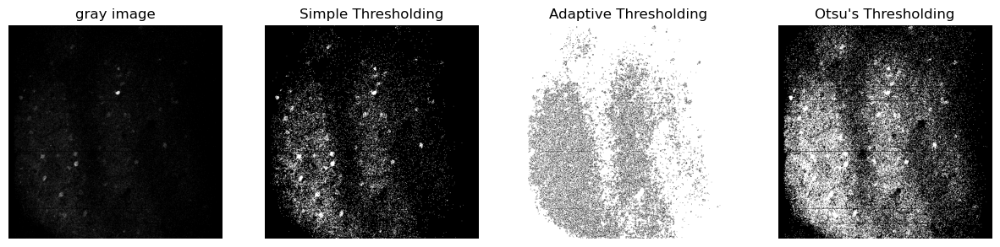

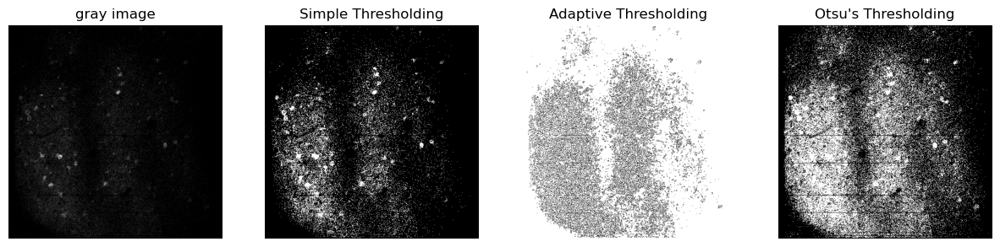

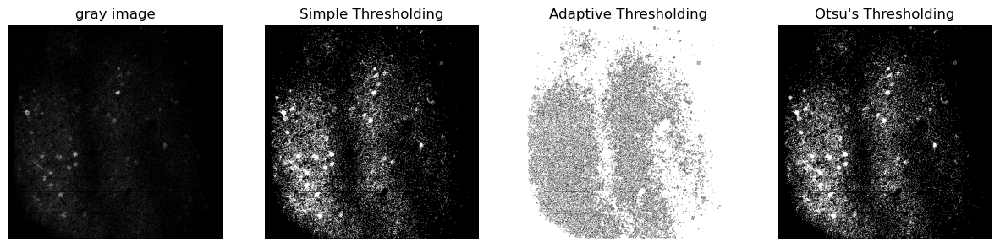

In [35]:
for img_path in im_list[:10:]:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)
    
    # Simple Thresholding
    _, simple_thresh = cv.threshold(gray_image, 1, 255, cv.THRESH_BINARY)

    # Adaptive Thresholding
    adaptive_thresh = cv.adaptiveThreshold(gray_image, 255, cv.ADAPTIVE_THRESH_MEAN_C, 
                                        cv.THRESH_BINARY, 3, 1)

    # Otsu's Thresholding
    _, otsu_thresh = cv.threshold(gray_image, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

    # Display the results
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title('gray image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(simple_thresh, cmap='gray')
    plt.title('Simple Thresholding')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(adaptive_thresh, cmap='gray')
    plt.title('Adaptive Thresholding')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(otsu_thresh, cmap='gray')
    plt.title("Otsu's Thresholding")
    plt.axis('off')

    plt.show()

# Noise Reducation Before Thresholding

## Gaussian Blur

We noticed we had to use a noise reduction step, so we tried to perform Gaussian Blur. Gaussian Blur is a smoothing technique that reduces noise by averaging pixel values with a Gaussian kernel, giving more weight to nearby pixels. Smoothing an image can assist in thresholding by reducing noise and enhancing the clarity of objects or features in the image, thereby making it easier to apply thresholding techniques effectively. beside reducing noise, smooothing the image can help reduce fine details and textures in an image and allow the focus to be on larger structures rather than intricate details. also, by reducing noise and small variations edge detection algorithms, which will bw used next, can better identify true edges in the image.

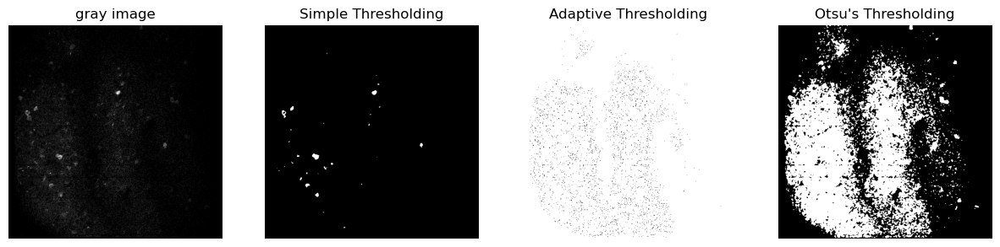

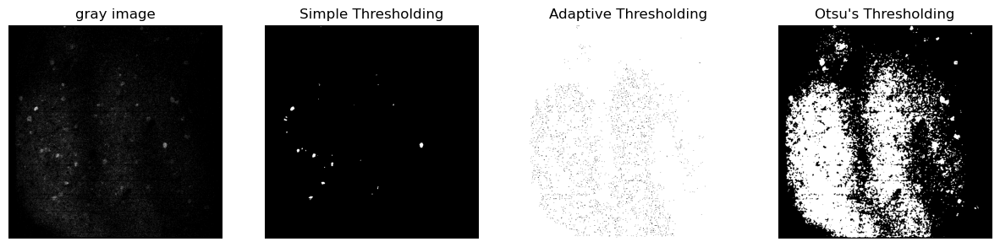

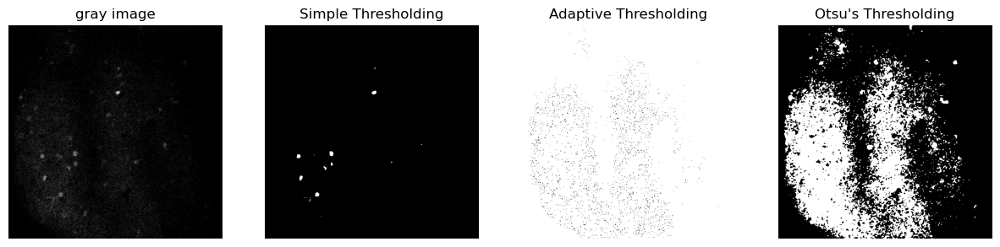

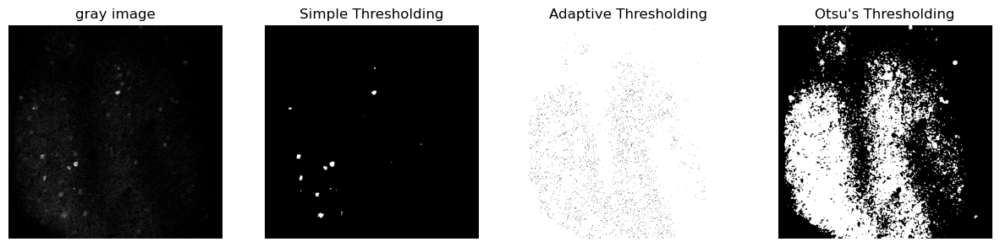

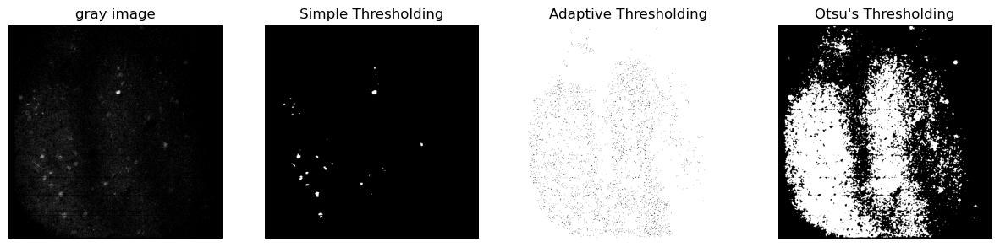

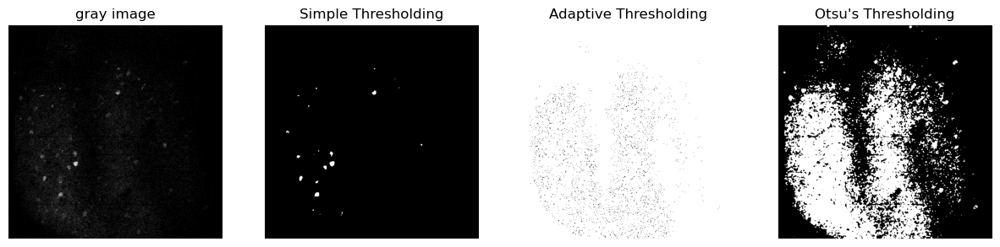

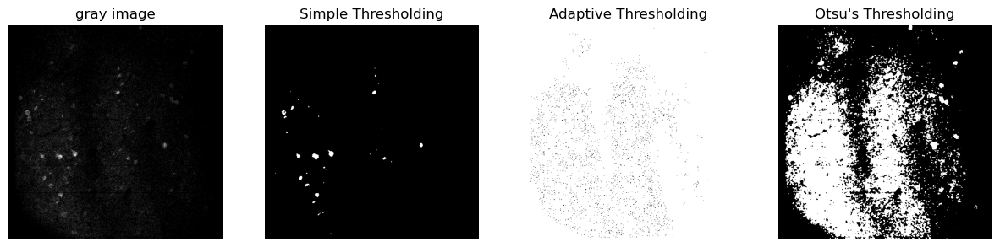

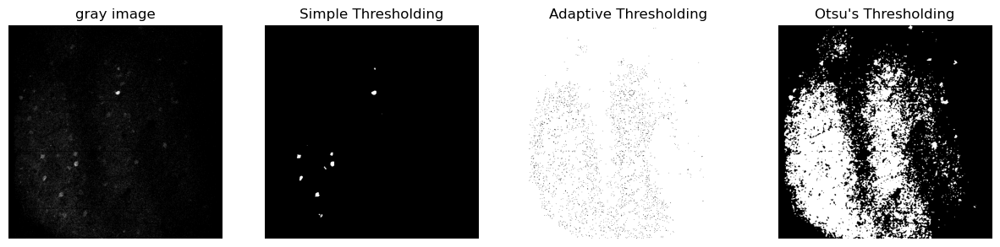

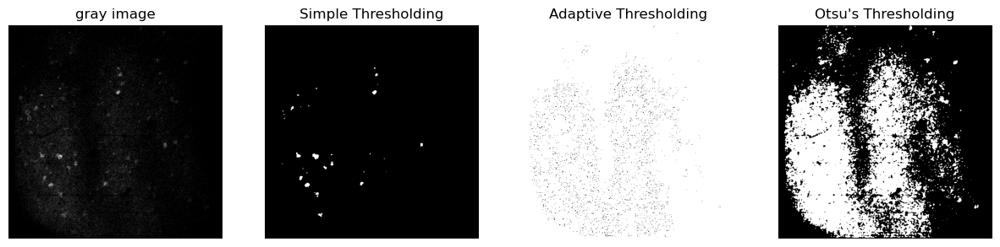

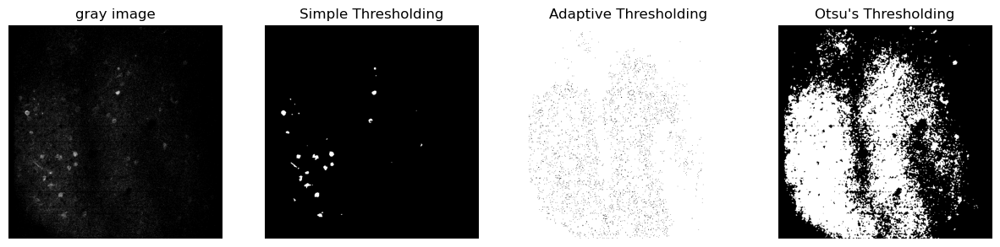

In [36]:
for img_path in im_list[:10:]:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

    # Apply Gaussian Blur
    blurred = cv.GaussianBlur(gray_image, (5, 5), 0)
    
# Simple Thresholding
    _, simple_thresh = cv.threshold(blurred, 3, 255, cv.THRESH_BINARY)

# Adaptive Thresholding
    adaptive_thresh = cv.adaptiveThreshold(blurred, 255, cv.ADAPTIVE_THRESH_MEAN_C, 
                                        cv.THRESH_BINARY, 3, 1)

# Otsu's Thresholding
    _, otsu_thresh = cv.threshold(blurred, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Display the results
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title('gray image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(simple_thresh, cmap='gray')
    plt.title('Simple Thresholding')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(adaptive_thresh, cmap='gray')
    plt.title('Adaptive Thresholding')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(otsu_thresh, cmap='gray')
    plt.title("Otsu's Thresholding")
    plt.axis('off')

    plt.show()

Only a simple threshold benefited from the Gaussian blur, and it wasn’t perfect, so we moved on to another technique—morphological opening

## Morphological opening

Morphological opening consists of two sequential operations: erosion followed by dilation. Erosion shrinks bright regions and enlarges dark regions, while dilation does the opposite. The erosion operation removes small bright spots (noise) by scanning through the image with a structuring element (a small shape such as a square or a circle) and replacing each pixel's value with the minimum value within the neighborhood defined by the structuring element. The dilation operation then expands the remaining regions, but since the small bright spots have been removed, dilation primarily affects larger structures.

The size and shape of the structuring element used in the erosion step determine what features are removed. By appropriately choosing the structuring element, one can target and remove noise spots of specific sizes and shapes while preserving the important features of the image. Gaussian blur, however, applies a uniform smoothing effect to the entire image, without considering the size or shape of the noise.


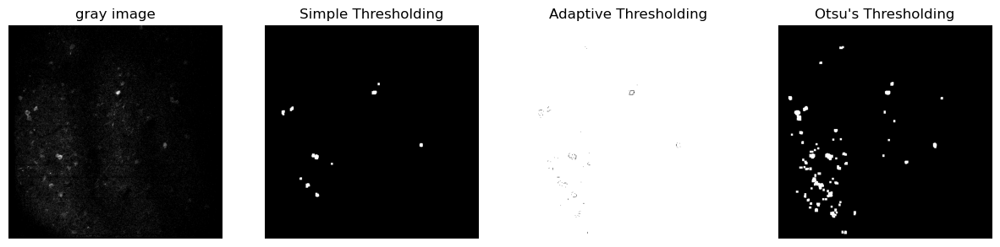

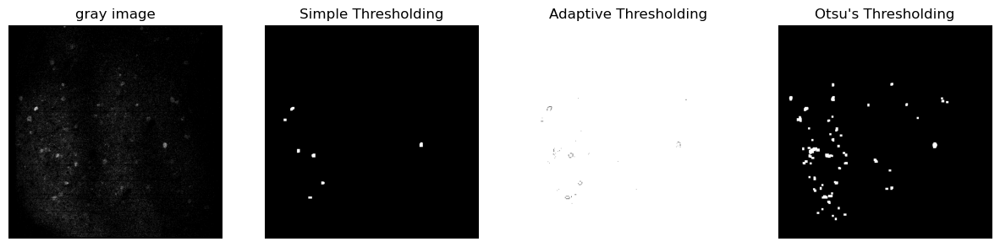

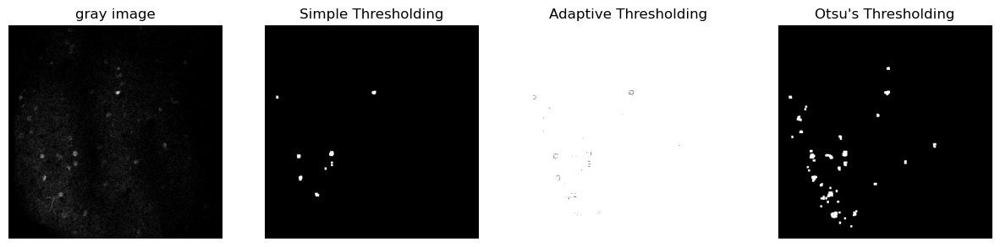

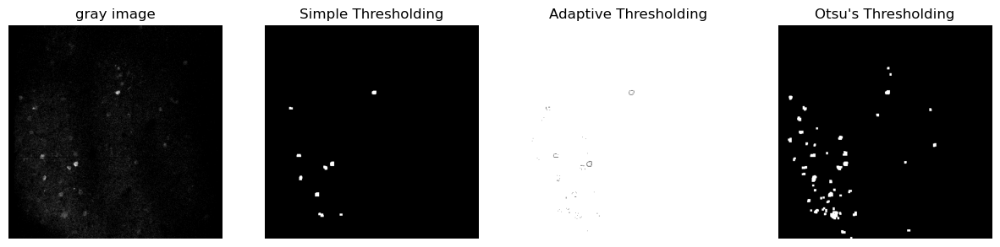

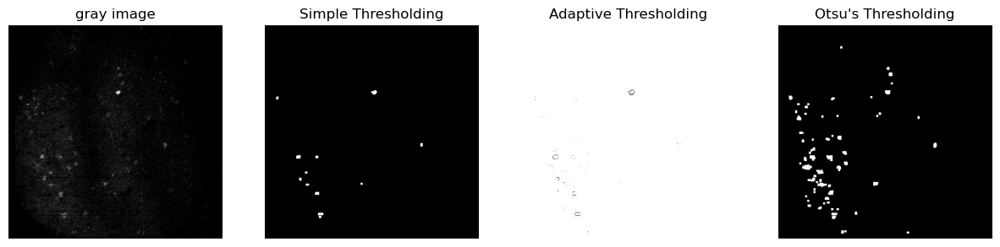

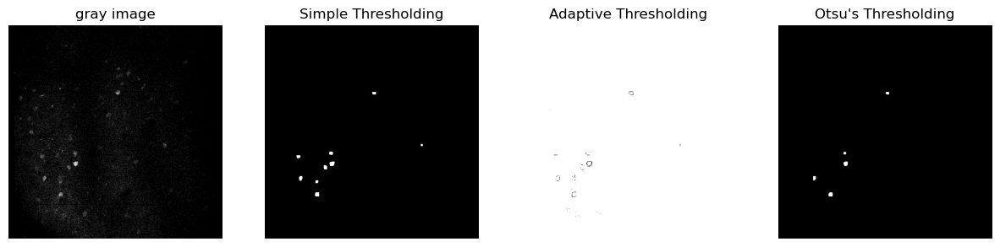

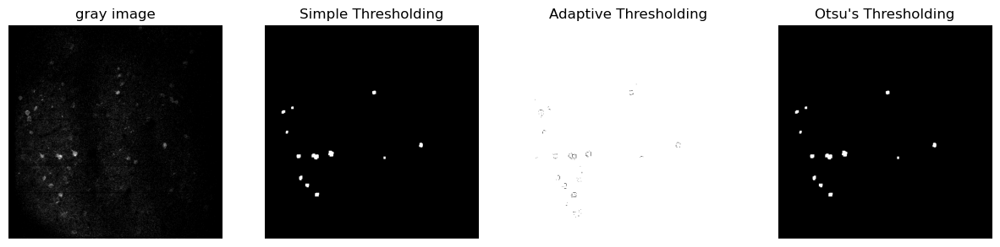

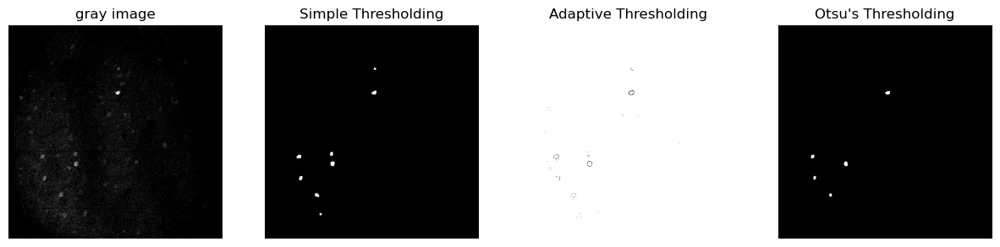

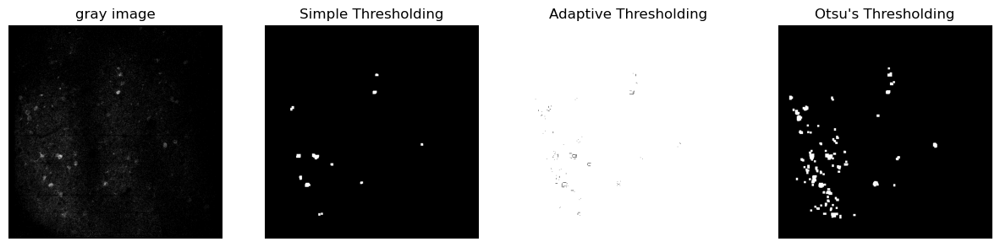

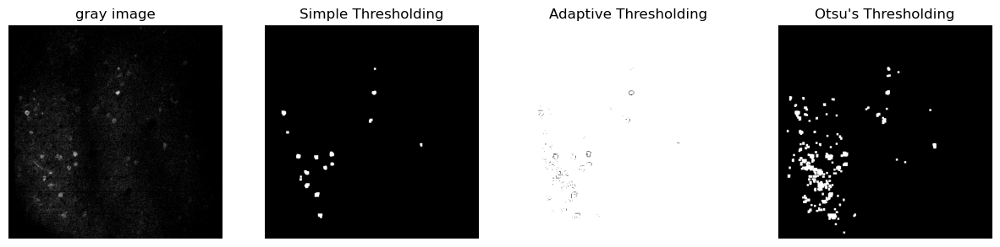

In [37]:
for img_path in im_list[:10:]:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

    # Morphological opening
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)
    
# Simple Thresholding
    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)

# Adaptive Thresholding
    adaptive_thresh = cv.adaptiveThreshold(opening, 255, cv.ADAPTIVE_THRESH_MEAN_C, 
                                        cv.THRESH_BINARY, 3, 1)

# Otsu's Thresholding
    _, otsu_thresh = cv.threshold(opening, 3, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Display the results
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title('gray image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(simple_thresh, cmap='gray')
    plt.title('Simple Thresholding')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(adaptive_thresh, cmap='gray')
    plt.title('Adaptive Thresholding')
    plt.axis('off')

    plt.subplot(1, 4, 4)
    plt.imshow(otsu_thresh, cmap='gray')
    plt.title("Otsu's Thresholding")
    plt.axis('off')

    plt.show()

We can improve Otsu thresholding to align with the others by increasing contrast, but we wanted to continue with simple thresholding to avoid this step in our code.

# Edge Detection

as we have learned, edge detection is a critical operation in image processing and computer vision, essential for feature extraction and object segmentation. we chose to use Canny edge detection. The Canny Edge Detection algorithm is a multi-stage process to detect a wide range of edges in images.

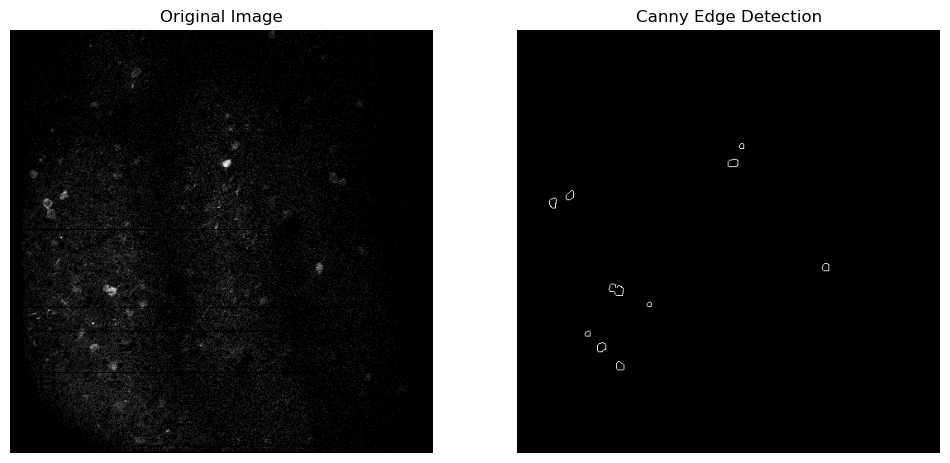

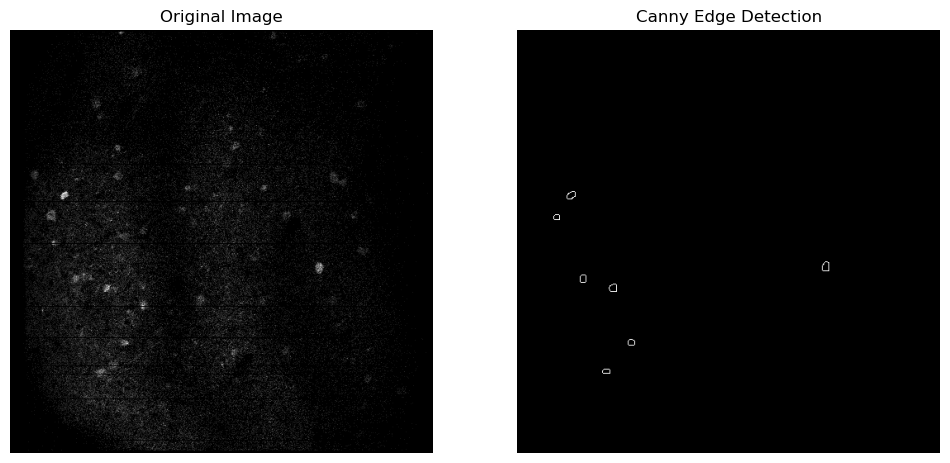

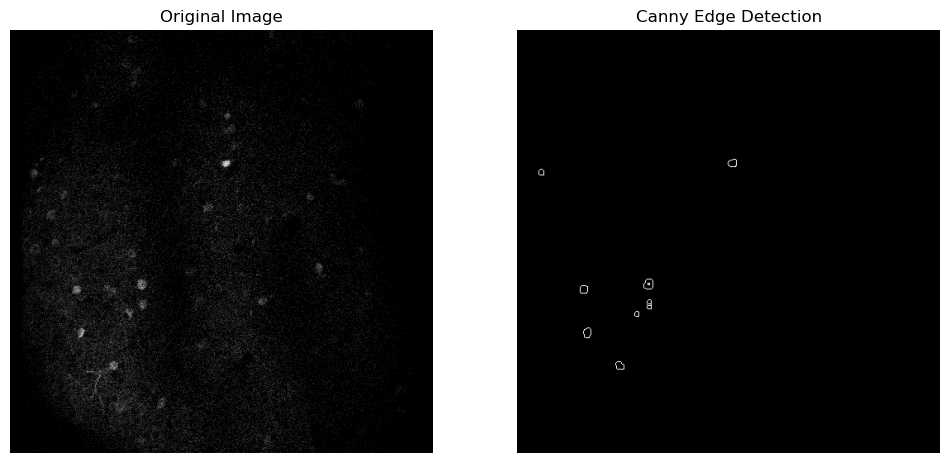

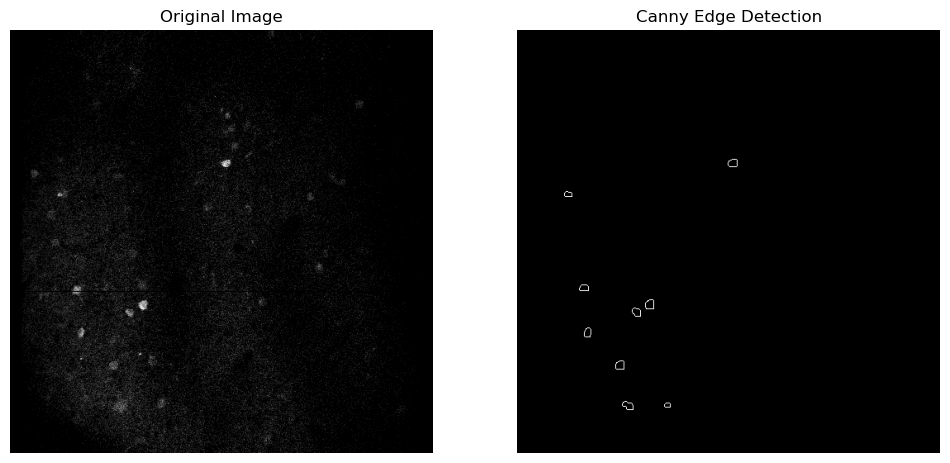

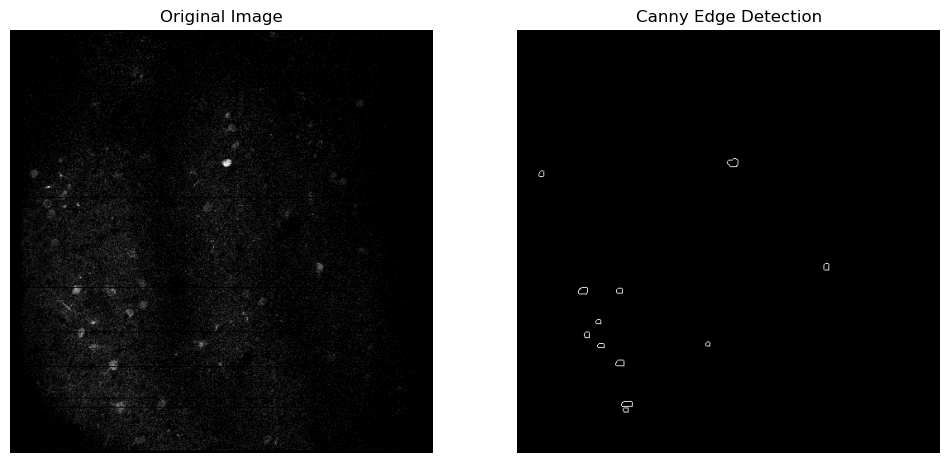

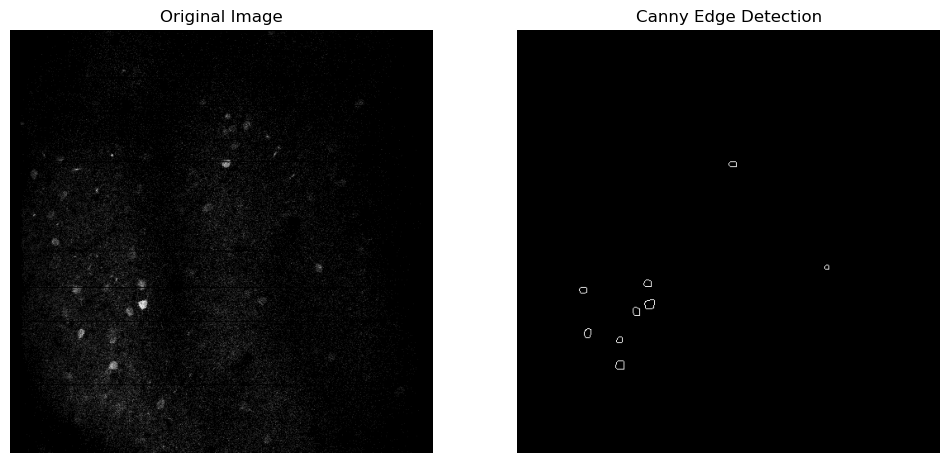

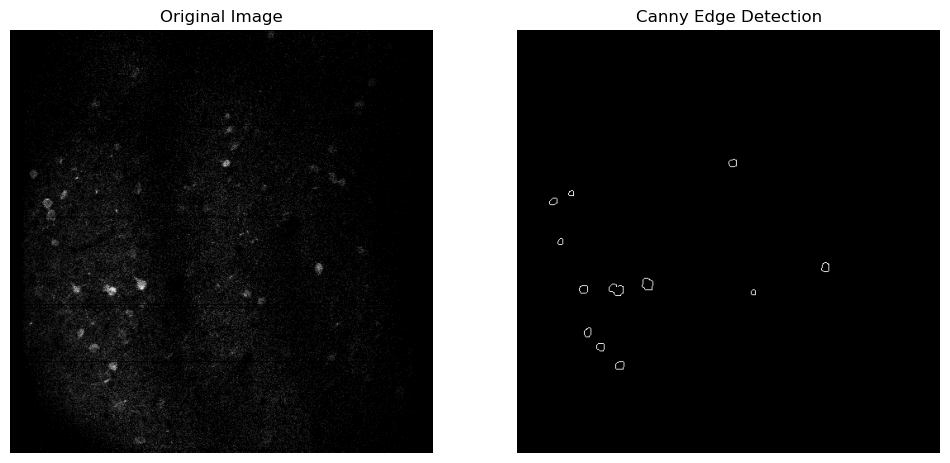

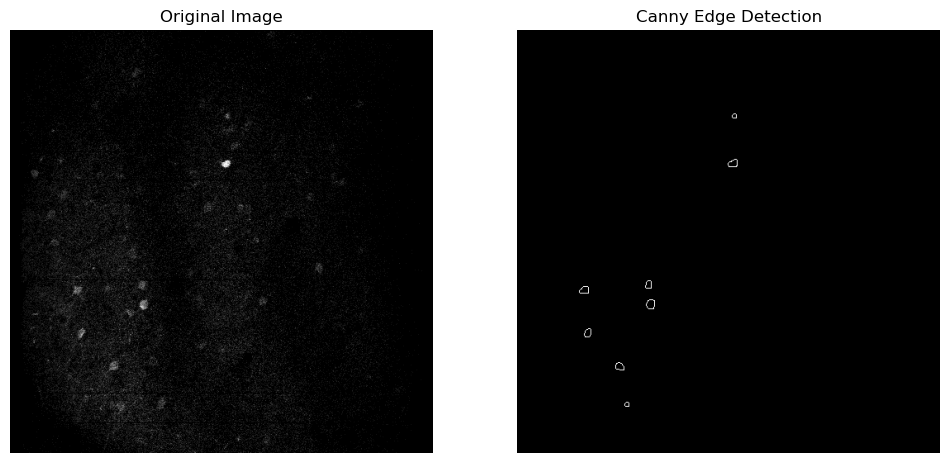

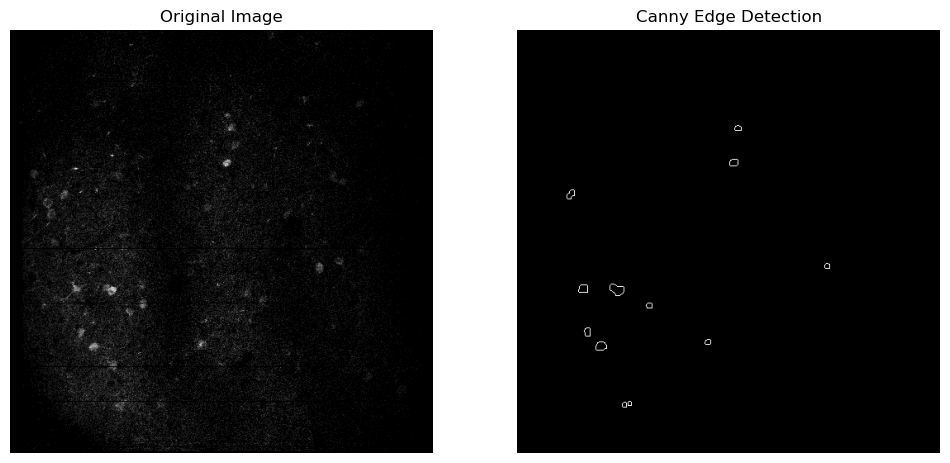

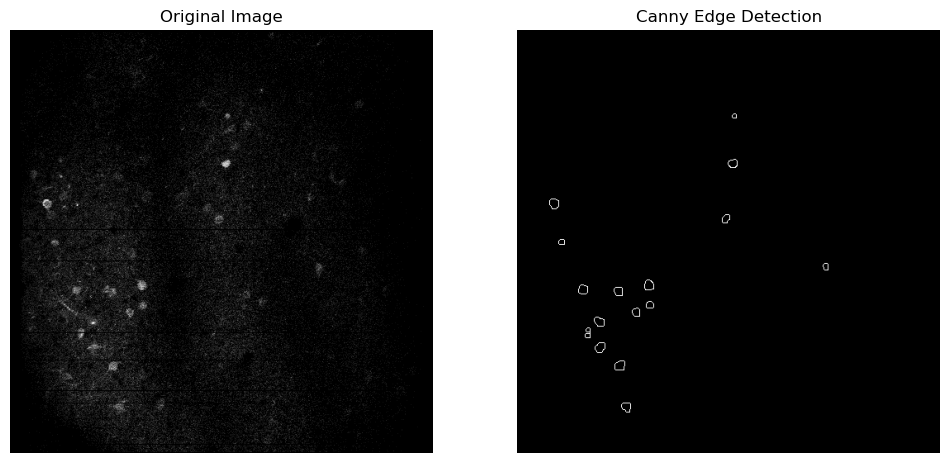

In [39]:


for img_path in im_list[:10:]:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)
    
    # Morphological opening 
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    # Simple Thresholding
    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)
    # Apply Canny edge detection
    edges = cv.Canny(simple_thresh, 100, 200)
    # Display the results
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    axs[0].imshow(gray_image, cmap='gray')
    axs[0].set_title('Original Image')
    axs[0].axis('off')

    axs[1].imshow(edges, cmap='gray')
    axs[1].set_title('Canny Edge Detection')
    axs[1].axis('off')

    plt.show()




# Segmentation


## Contour Based Segmentation

A contour is a curve joining continuous points along the boundary of an object in the image. Contours offer advantages over methods that rely solely on geometric shapes like circles for recognizing cells, especially when cells do not have a perfect circular shape. (Figure 2).

The process often begins with edge detection techniques, such as the Canny edge detection algorithm, to identify potential boundaries or edges in the image


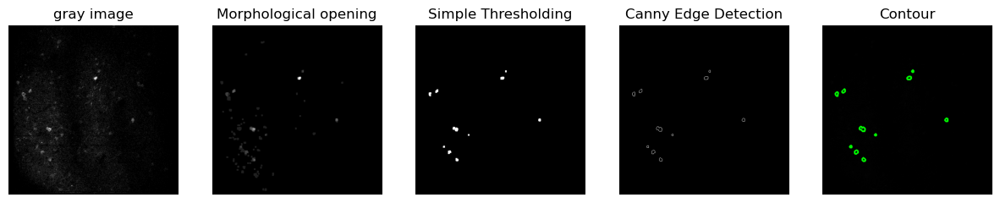

Number of cells found: 10


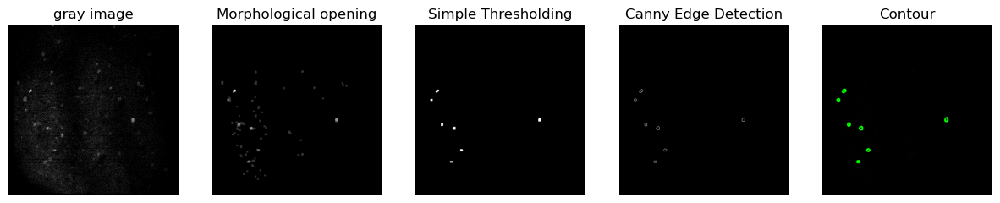

Number of cells found: 7


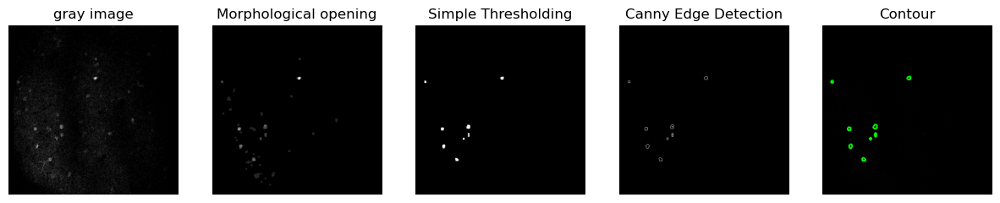

Number of cells found: 8


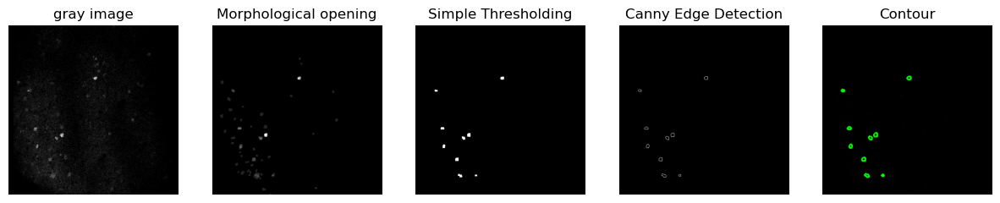

Number of cells found: 9


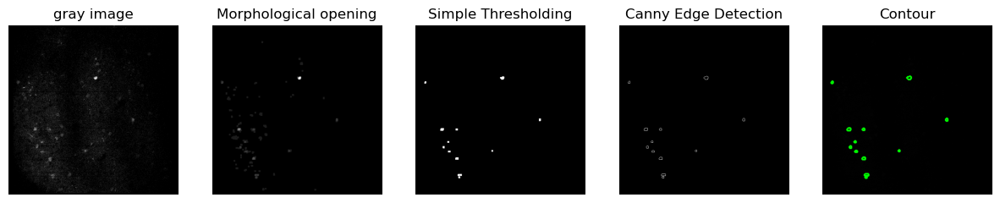

Number of cells found: 12


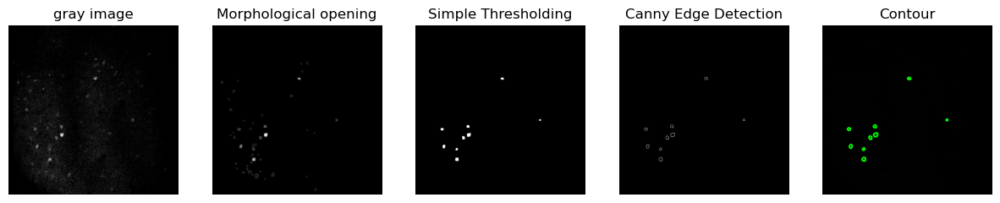

Number of cells found: 9


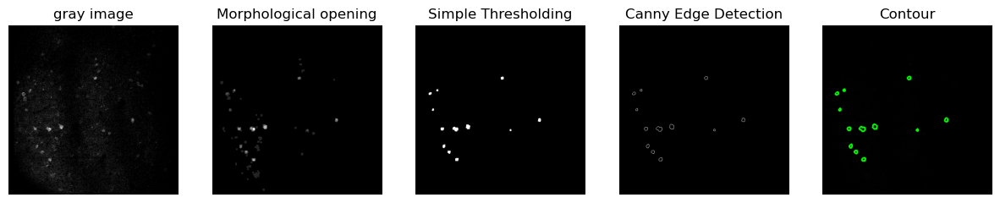

Number of cells found: 12


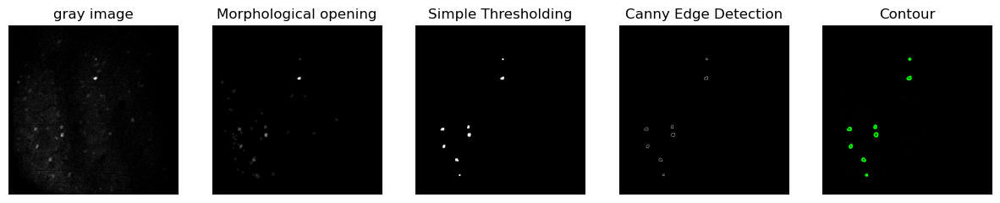

Number of cells found: 8


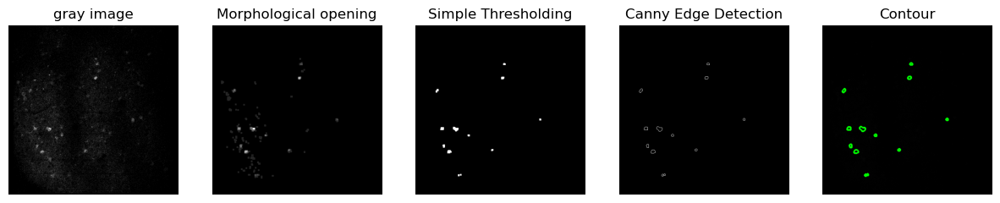

Number of cells found: 12


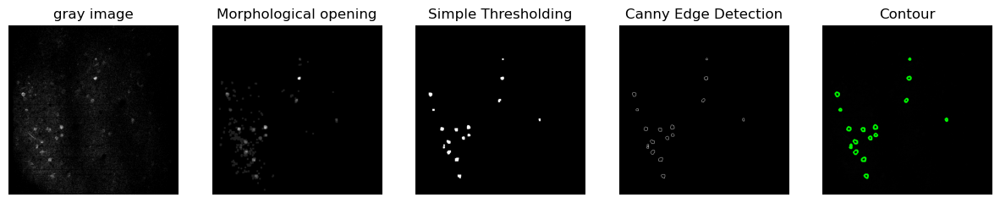

Number of cells found: 16


In [40]:
for img_path in im_list[:10:]:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)    
   
    # Morphological opening
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    # Simple Thresholding
    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)
    # Apply Canny edge detection
    edges = cv.Canny(simple_thresh, 100, 200)

    # Find contours
    contours, _ = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contour_image = cv.drawContours(cv.cvtColor(gray_image, cv.COLOR_GRAY2BGR), contours, -1, (0, 255, 0), 3)
    
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 5, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title('gray image')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(opening, cmap='gray')
    plt.title('Morphological opening')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(simple_thresh, cmap='gray')
    plt.title("Simple Thresholding")
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edge Detection')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(contour_image, cmap='gray')
    plt.title('Contour')
    plt.axis('off')

    plt.show()
    print(f"Number of cells found: {len(contours)}")

But than we found canny edges was not neccessary for the process:

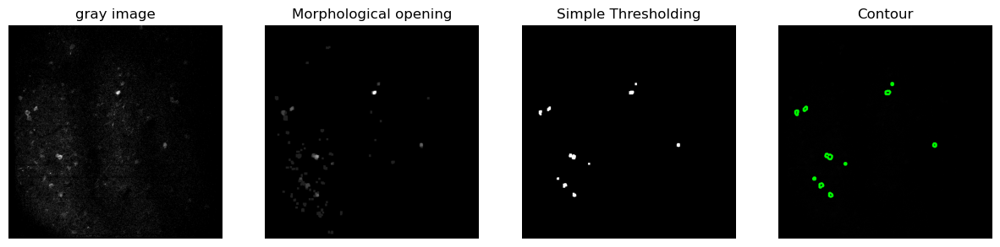

Number of cells found: 10


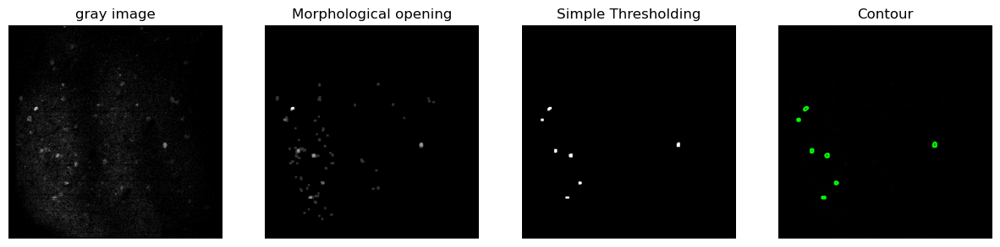

Number of cells found: 7


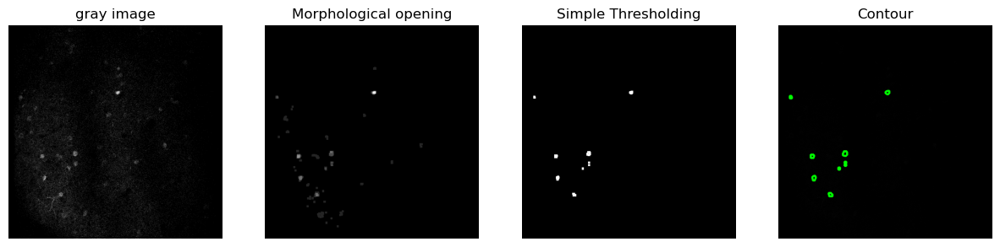

Number of cells found: 9


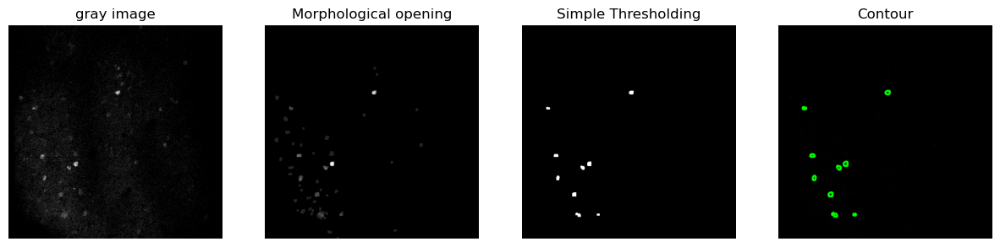

Number of cells found: 9


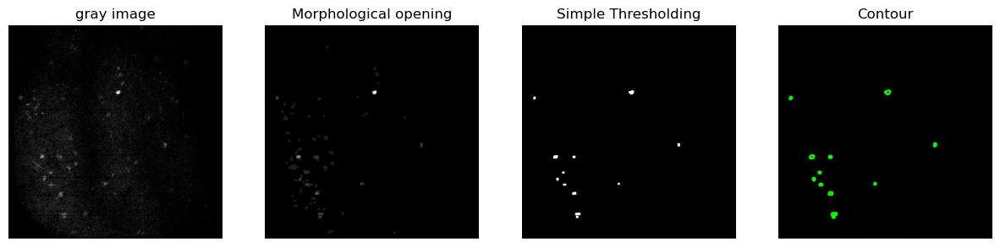

Number of cells found: 12


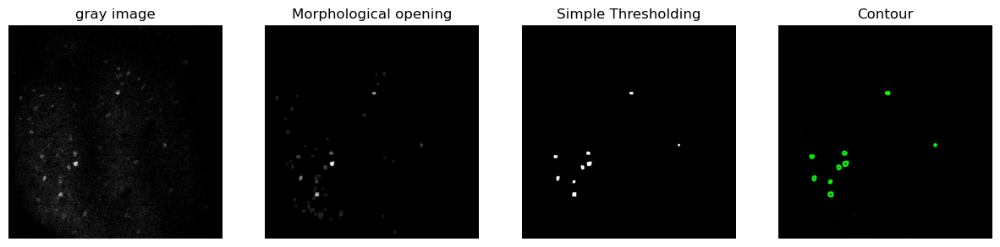

Number of cells found: 9


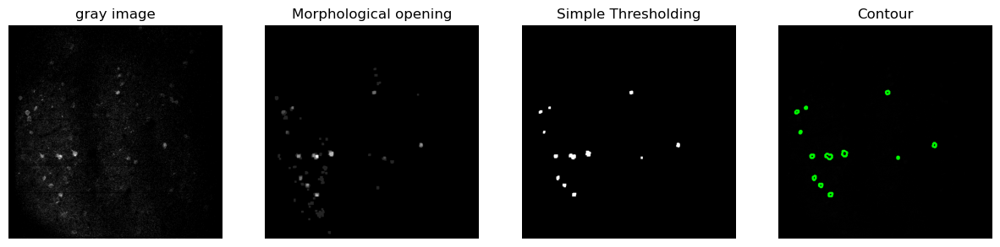

Number of cells found: 12


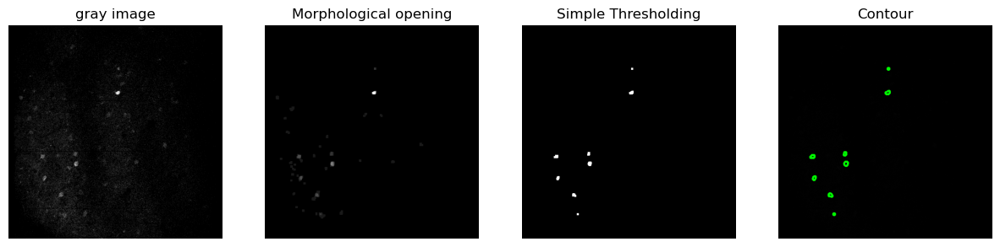

Number of cells found: 8


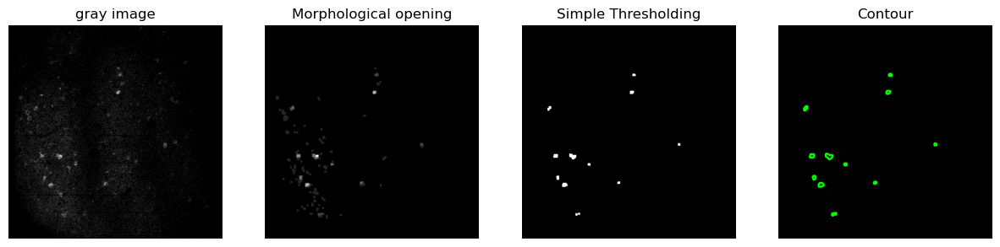

Number of cells found: 12


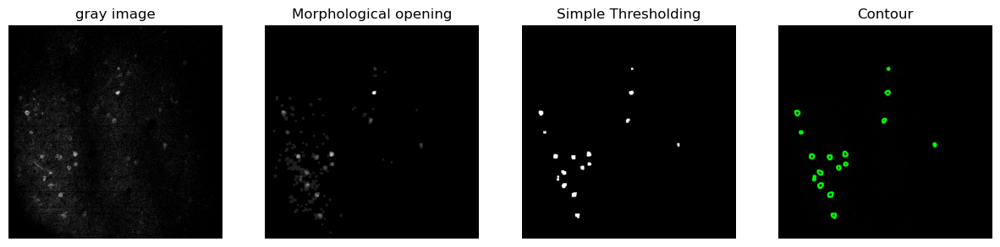

Number of cells found: 17


In [41]:
for img_path in im_list[:10:]:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)
    
    # Morphological opening 
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    # Simple Thresholding
    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)

    # Find contours
    contours, _ = cv.findContours(simple_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contour_image = cv.drawContours(cv.cvtColor(gray_image, cv.COLOR_GRAY2BGR), contours, -1, (0, 255, 0), 3)
    
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 4, 1)
    plt.imshow(gray_image, cmap='gray')
    plt.title('gray image')
    plt.axis('off')

    plt.subplot(1, 4, 2)
    plt.imshow(opening, cmap='gray')
    plt.title('Morphological opening')
    plt.axis('off')

    plt.subplot(1, 4, 3)
    plt.imshow(simple_thresh, cmap='gray')
    plt.title("Simple Thresholding")
    plt.axis('off')


    plt.subplot(1, 4, 4)
    plt.imshow(contour_image, cmap='gray')
    plt.title('Contour')
    plt.axis('off')

    plt.show()
    print(f"Number of cells found: {len(contours)}")

The combination of morphological opening and thresholding is already sufficient. after applying morphological opening and thresholding, we are already highlighting the edges of objects in the image. Morphological operations can enhance or suppress edges based on the structuring element used. Thresholding further emphasizes the contrast between objects and their background. The Canny edge detection step did not add significant additional information in this specific case.

To identify all cells across multiple time points, we aimed to construct a unified pattern encompassing all cells illuminated in different images. This pattern will facilitate the detection of illumination and enable analysis of calcium response across all images: 

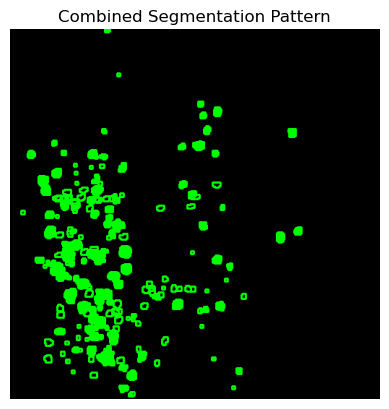

In [42]:
# Initialize the combined canvas with zeros
combined_canvas = np.zeros((512, 512,3), dtype=np.uint8)

for img_path in im_list:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

    
    # Morphological opening
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    # Simple Thresholding
    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)

    # Find contours
    contours, _ = cv.findContours(simple_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)


    # Draw contours on the canvas
    cv.drawContours(combined_canvas, contours, -1, (0,255,0), thickness=2)


# Display the final combined segmentation pattern
plt.imshow(combined_canvas, cmap='gray')
plt.title('Combined Segmentation Pattern')
plt.axis('off')
plt.show()

Since the illumination is progressive, we sought to exclude any contours nested within others since we're observing the same cell at different illumination stages. The largest mark represents the entire cell; hence, we aim to retain only the largest one and remove all intersections

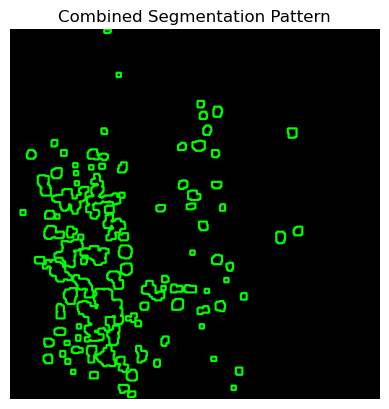

In [43]:
# Initialize the combined canvas with zeros
combined_canvas = np.zeros((512, 512), dtype=np.uint8)

# Function to check if one contour is inside another contour
def is_contour_inside(contour, outer_contours):
    for outer in outer_contours:
        if np.array_equal(contour, outer):
            continue
        for point in contour:
            point_tuple = tuple(map(int, point[0])) 
            if cv.pointPolygonTest(outer, point_tuple, False) >= 0:
                return True
    return False

for img_path in im_list:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)
    
    # Morphological opening 
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)


    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)

    # Find contours
    contours, _ = cv.findContours(simple_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)


    # Draw contours on the canvas
    cv.drawContours(combined_canvas, contours, -1, 255, thickness=2)

# Find all contours in the combined canvas
final_contours, _ = cv.findContours(combined_canvas, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filter out contours that are inside other contours
filtered_final_contours = [cnt for cnt in final_contours if not is_contour_inside(cnt, final_contours)]

# Initialize an RGB canvas for the final contours
final_canvas_rgb = np.zeros((512, 512, 3), dtype=np.uint8)

# Draw the filtered contours
cv.drawContours(final_canvas_rgb, filtered_final_contours, -1, (0, 255, 0), thickness=2)

# Display
plt.imshow(final_canvas_rgb)
plt.title('Combined Segmentation Pattern')
plt.axis('off')
plt.show()

Next, we apply more noise reduction to the contours by filtering based on minimum area. This operation technique helps produce cleaner and more accurate contours by removing small, irrelevant details while preserving the main features of interest, such as the cells. Filtering contours by minimum area also assists in distinguishing between individual cells by removing small noise and connecting structures. In images where cells are close together or overlapping, noise or small artifacts may connect adjacent cells, causing them to be detected as a single contour.


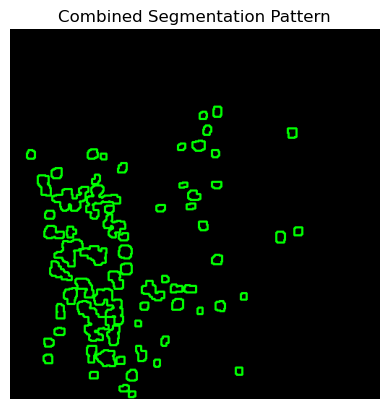

In [44]:
# Initialize the combined canvas with zeros
combined_canvas = np.zeros((512, 512), dtype=np.uint8)

# Function to check if one contour is inside another contour
def is_contour_inside(contour, outer_contours):
    for outer in outer_contours:
        if np.array_equal(contour, outer):
            continue
        for point in contour:
            point_tuple = tuple(map(int, point[0])) 
            if cv.pointPolygonTest(outer, point_tuple, False) >= 0:
                return True
    return False

for img_path in im_list:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)    

    # Morphological opening 
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    # Simple Thresholding
    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)

    # Find contours
    contours, _ = cv.findContours(simple_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # Filter contours by a minimum area
    min_contour_area = 30 #fine-tune sensitivity
    moderate_contours = [cnt for cnt in contours if cv.contourArea(cnt) > min_contour_area]


    # Draw contours on the canvas
    cv.drawContours(combined_canvas, moderate_contours, -1, 255, thickness=2)

# Find all contours in the combined canvas
final_contours, _ = cv.findContours(combined_canvas, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filter out contours that are inside other contours
filtered_final_contours = [cnt for cnt in final_contours if not is_contour_inside(cnt, final_contours)]

# Initialize an RGB canvas for the final contours
final_canvas_rgb = np.zeros((512, 512, 3), dtype=np.uint8)

# Draw the filtered contours
cv.drawContours(final_canvas_rgb, filtered_final_contours, -1, (0, 255, 0), thickness=2)

# Display
plt.imshow(final_canvas_rgb)
plt.title('Combined Segmentation Pattern')
plt.axis('off')
plt.show()

Adding an upper limit to the contour filter ensures that excessively large structures, which may encompass multiple cells or non-cellular features, are excluded:

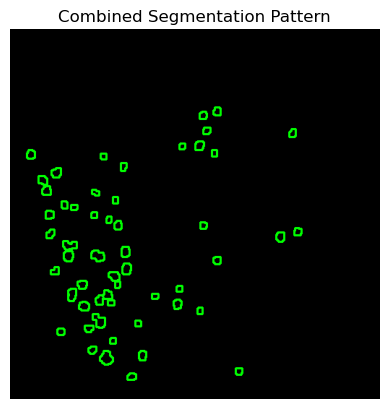

In [45]:
# Initialize the combined canvas with zeros
combined_canvas = np.zeros((512, 512), dtype=np.uint8)

# Function to check if one contour is inside another contour
def is_contour_inside(contour, outer_contours):
    for outer in outer_contours:
        if np.array_equal(contour, outer):
            continue
        for point in contour:
            point_tuple = tuple(map(int, point[0])) 
            if cv.pointPolygonTest(outer, point_tuple, False) >= 0:
                return True
    return False

for img_path in im_list:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)

    
    # Morphological opening
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)



    # Find contours
    contours, _ = cv.findContours(simple_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # Filter contours by a minimum area
    min_contour_area = 30  #fine-tune sensitivity
    max_contour_area = 35 #an upper limit
    moderate_contours = [cnt for cnt in contours if min_contour_area < cv.contourArea(cnt) < max_contour_area]


    # Draw contours on the canvas
    cv.drawContours(combined_canvas, moderate_contours, -1, 255, thickness=2)

# Find all contours in the combined canvas
final_contours, _ = cv.findContours(combined_canvas, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filter out contours that are inside other contours
filtered_final_contours = [cnt for cnt in final_contours if not is_contour_inside(cnt, final_contours)]

# Initialize an RGB canvas for the final contours
final_canvas_rgb = np.zeros((512, 512, 3), dtype=np.uint8)

# Draw the filtered contours 
cv.drawContours(final_canvas_rgb, filtered_final_contours, -1, (0, 255, 0), thickness=2)

# Display 
plt.imshow(final_canvas_rgb)
plt.title('Combined Segmentation Pattern')
plt.axis('off')
plt.show()

And the final result of segmentation after numbering the cells so we can get a fixed identity of each cell:

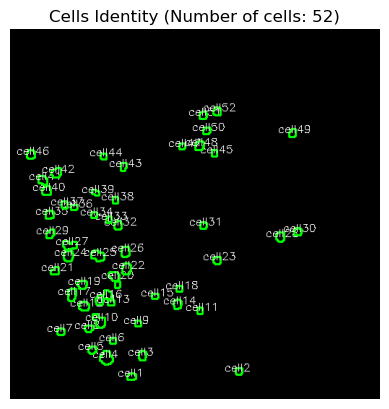

In [46]:
# Initialize the combined canvas with zeros
combined_canvas = np.zeros((512, 512), dtype=np.uint8)

# Function to check if one contour is inside another contour
def is_contour_inside(contour, outer_contours):
    for outer in outer_contours:
        if np.array_equal(contour, outer):
            continue
        for point in contour:
            point_tuple = tuple(map(int, point[0])) 
            if cv.pointPolygonTest(outer, point_tuple, False) >= 0:
                return True
    return False

for img_path in im_list:
    image = cv.imread(img_path)

    if len(image.shape) > 2 and image.shape[2] == 3:
    # Convert to grayscale if it is a color image
        gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    else:
    # Use the image as is if it is already in grayscale
        gray_image = image
        # Convert to 8-bit (if not already)
    # Convert to 8-bit (if not already)
    if gray_image.dtype != np.uint8:
        gray_image = cv.normalize(gray_image, None, 0, 255, cv.NORM_MINMAX, dtype=cv.CV_8U)
    

    # Morphological opening 
    kernel = np.ones((5,5), np.uint8)
    opening = cv.morphologyEx(gray_image, cv.MORPH_OPEN, kernel)

    _, simple_thresh = cv.threshold(opening, 1, 255, cv.THRESH_BINARY)


    # Find contours
    contours, _ = cv.findContours(simple_thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # Filter contours by a minimum and maximum area
    min_contour_area = 30  
    max_contour_area = 35 
    moderate_contours = [cnt for cnt in contours if min_contour_area < cv.contourArea(cnt) < max_contour_area]


    # Draw contours on the canvas
    cv.drawContours(combined_canvas, moderate_contours, -1, 255, thickness=2)

# Find all contours in the combined canvas
final_contours, _ = cv.findContours(combined_canvas, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Filter out contours that are inside other contours
filtered_final_contours = [cnt for cnt in final_contours if not is_contour_inside(cnt, final_contours)]

# Initialize an RGB canvas for the final contours
final_canvas_rgb = np.zeros((512, 512, 3), dtype=np.uint8)

# Draw the filtered contours and label them 
for i, cnt in enumerate(filtered_final_contours):
    cv.drawContours(final_canvas_rgb, [cnt], -1, (0, 255, 0), thickness=2)
    M = cv.moments(cnt)
    if M["m00"] != 0:
        cX = int(M["m10"] / M["m00"])
        cY = int(M["m01"] / M["m00"])
        cv.putText(final_canvas_rgb, f'cell{i+1}', (cX - 20, cY), cv.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

# Display 
num_cells = len(filtered_final_contours)
plt.imshow(final_canvas_rgb)
plt.title(f'Cells Identity (Number of cells: {num_cells})')
plt.axis('off')
plt.show()

As we experimented with various parameters in the code to enhance cell identification, we observed that increasing the number of detected cells comes at the expense of distinguishing between cells (often resulting in multiple cells being considered as one). Consequently, we sought a more effective method for segmenting the cells.